# Charuco recognition based on openpose calibrated camera set

using the "model" folder 




In [10]:
import glob
import numpy as np
import cv2
from cv2 import aruco

import os

import json

import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

squareLength = 50.0 / 1000 # chessboard square side length (normally in meters)
markerLength = 30.0 / 1000 # marker side length (same unit than squareLength)
squaresX = 11
squaresY = 8

dictionary = cv2.aruco.getPredefinedDictionary(cv2.aruco.DICT_4X4_250)
board = cv2.aruco.CharucoBoard_create(squaresX,squaresY,squareLength,markerLength,dictionary)


%matplotlib notebook

print("opencv version",cv2.__version__)

opencv version 3.4.1


# Load Calibration

In [5]:
filename = "models/18284509.xml"

fs = cv2.FileStorage(filename, cv2.FILE_STORAGE_READ)

intrinsics = fs.getNode("Intrinsics").mat()
dist_coeffs = fs.getNode("Distortion").mat()

fs.release()

print(intrinsics)
print(dist_coeffs)

[[2.51917792e+03 0.00000000e+00 6.37159831e+02]
 [0.00000000e+00 2.50824100e+03 5.12930776e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
[[-9.79304936e-01]
 [ 8.02296288e-01]
 [-3.22019007e-03]
 [-2.19731027e-03]
 [-5.12975838e+01]
 [ 1.23669913e+00]
 [-5.70462617e+00]
 [-4.86637958e+01]]


## Load Images 

In [7]:
images = glob.glob("sample-data/frame*.jpg")
images.sort()

print("{} image files found".format(len(images))) 


4 image files found


<IPython.core.display.Javascript object>


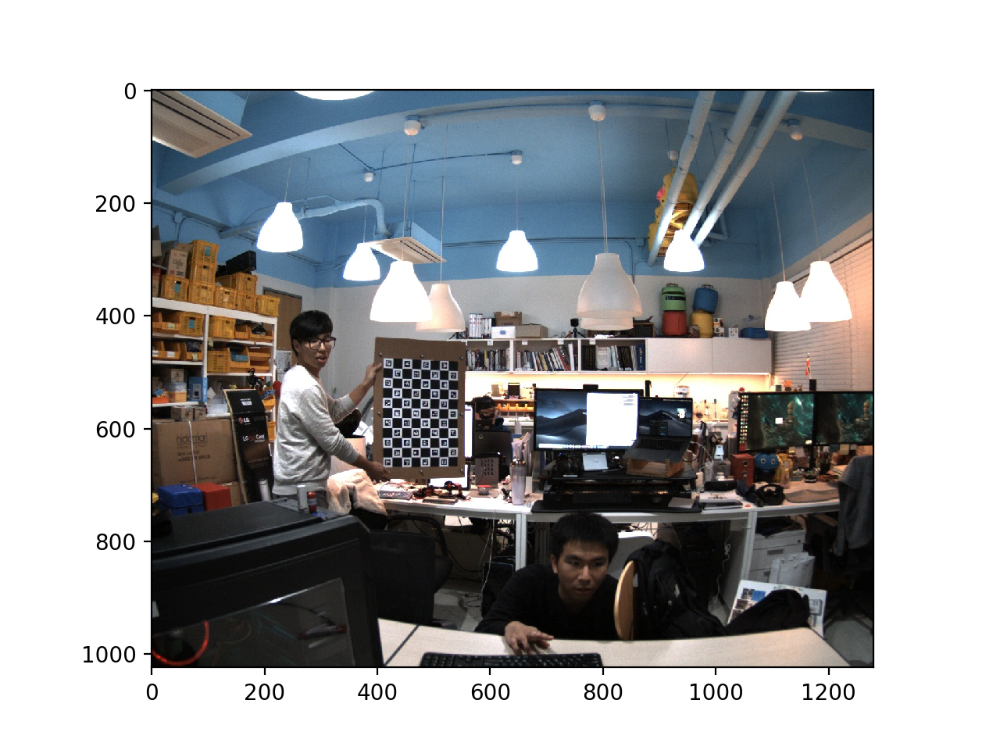

image shape: (1024, 1280, 3)


In [8]:
i = 0
figure1 = plt.figure()
img = cv2.imread(images[i])
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB),  interpolation = "nearest")
print("image shape: {}".format(img.shape))

imsize = (img.shape[0], img.shape[1])


In [12]:
allCorners=[]
allIds=[]
images2=[]

# function because we use later
def find_charuco_board(img, board, dictionary):
    corner_criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.00001)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    corners, ids, rejectedImgPoints = cv2.aruco.detectMarkers(gray, dictionary)    
    if len(corners)>0:
        for corner in corners:
            cv2.cornerSubPix(gray, corner, winSize=(3,3), zeroZone=(-1,-1), criteria=corner_criteria)        
        ret, detectedCorners, detectedIds = cv2.aruco.interpolateCornersCharuco(corners,ids,gray,board)
        if detectedCorners is not None and detectedIds is not None and len(detectedCorners)>3:
            return detectedCorners, detectedIds
    return [], []

for i in images:
    img = cv2.imread(i)
    corners, ids = find_charuco_board(img, board, dictionary)
    if len(corners) > 0:
        allCorners.append(corners)
        allIds.append(ids)
        images2.append(i)
        
            
images = images2 # filter out the skipped images


print("images left {}".format(len(images2)))
print(images)


images left 2
['sample-data/frame_000000000002.jpg', 'sample-data/frame_000000000004.jpg']


<IPython.core.display.Javascript object>


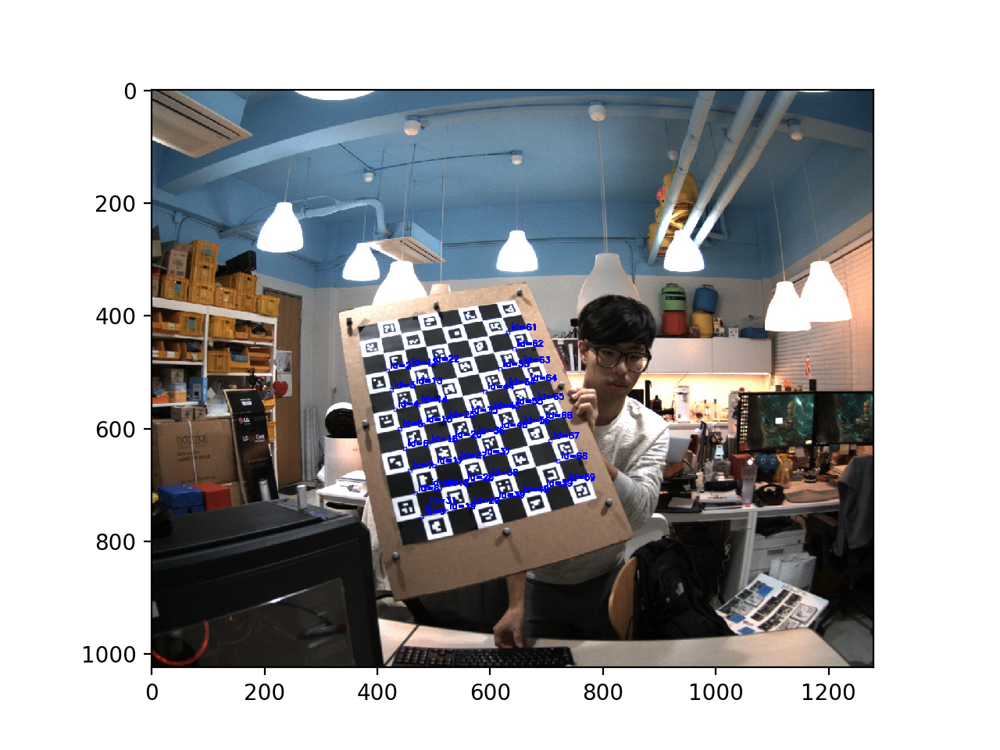

number of corners: 47


In [14]:
# draw a corner

i = 1
figure1 = plt.figure()
img = cv2.imread(images[i])
img = cv2.aruco.drawDetectedCornersCharuco(img, allCorners[i], allIds[i])

plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB),  interpolation = "nearest")
plt.show()

print("number of corners: {}".format(len(allCorners[i])))



## check calibration result

Draw Coordinate axis

In [16]:
def find_aruco_markers(img, dictionary):
    corner_criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.00001)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    corners, ids, rejectedImgPoints = cv2.aruco.detectMarkers(gray, dictionary)    
    if len(corners)>0:
        for corner in corners:
            cv2.cornerSubPix(gray, corner, winSize=(3,3), zeroZone=(-1,-1), criteria=corner_criteria)        
        
        return corners, ids
    return [], []

<IPython.core.display.Javascript object>


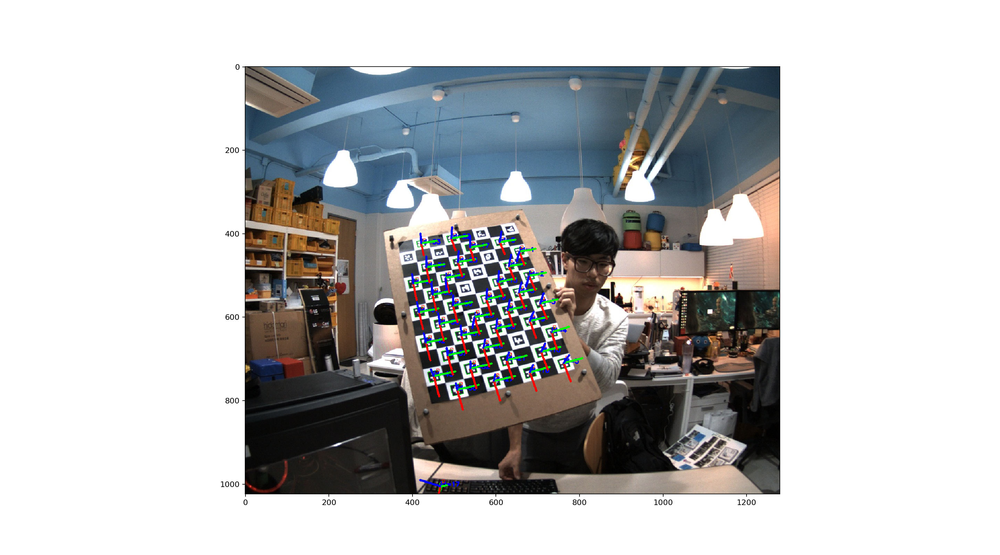

In [24]:
test_img = cv2.imread("sample-data/frame_000000000004.jpg")

corners, ids = find_aruco_markers(test_img, dictionary)
test_img_2 = aruco.drawDetectedMarkers(test_img, corners, ids)

rvecs,tvecs, objPts = aruco.estimatePoseSingleMarkers(corners, markerLength , intrinsics, dist_coeffs)

for i in range(len(tvecs)):
    test_img_2 = aruco.drawAxis(test_img_2,  intrinsics, dist_coeffs, rvecs[i], tvecs[i], 2*markerLength)

plt.figure(figsize=(18, 10), dpi= 80)
plt.imshow(cv2.cvtColor(test_img_2, cv2.COLOR_BGR2RGB), interpolation = "nearest")


ax.azim -60
ax.elev 30


Text(0.5, 0, 'Z Label')

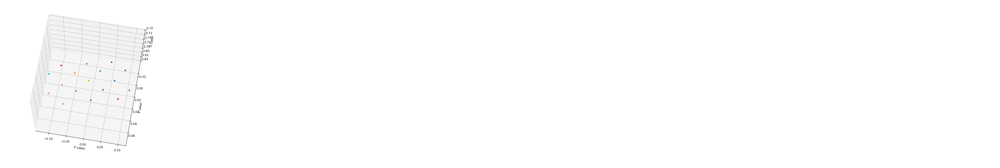

In [12]:
# plot the tvecs in 3D

fig = plt.figure(figsize=(10, 10), dpi= 80)

ax = fig.add_subplot(1,1,1, projection='3d')
print('ax.azim {}'.format(ax.azim))
print('ax.elev {}'.format(ax.elev))
ax.view_init(-110,260)
for p in tvecs:
    p2 = p[0]
    ax.scatter(p2[0],p2[1],p2[2])

    

ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')





position (tvec) [[-0.00823549]
 [-0.36930131]
 [ 2.41169248]] 
rotation matrix 3x3 from rvec) {}  [[-0.28343222  0.85611101 -0.43213437]
 [ 0.75855046  0.47583969  0.44517163]
 [ 0.58674302 -0.20161975 -0.7842717 ]]
{"rot3x3": [[-0.2834322162345272, 0.8561110115070352, -0.43213437120505205], [0.7585504638174347, 0.475839693551101, 0.4451716296930314], [0.5867430209578459, -0.2016197461004154, -0.7842717037734213]]}


<IPython.core.display.Javascript object>


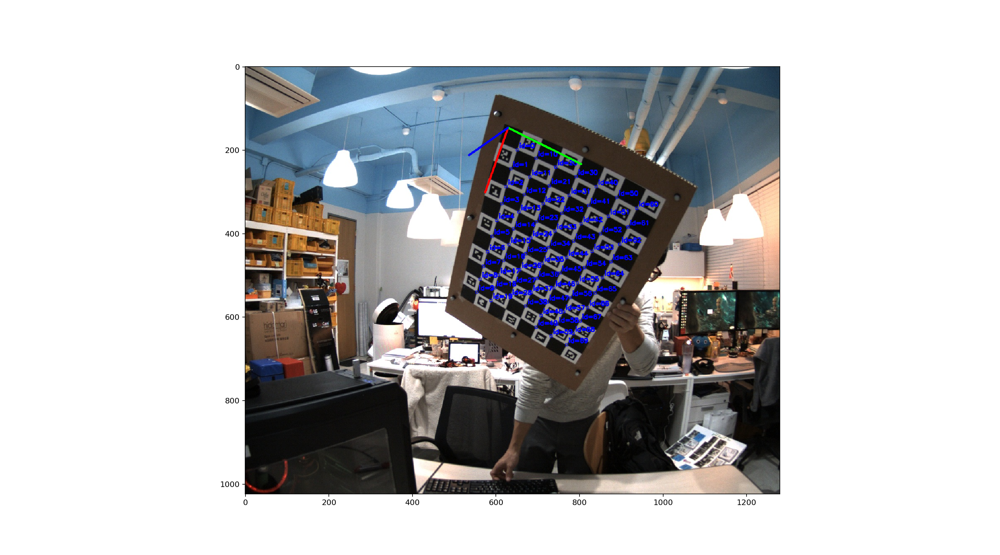

In [23]:
i = 1
test_img = cv2.imread("sample-data/frame_000000000002.jpg")

corners2, ids2 = find_charuco_board(test_img, board, dictionary)
img = cv2.aruco.drawDetectedCornersCharuco(test_img, corners2, ids2)
valid, rvec, tvec = cv2.aruco.estimatePoseCharucoBoard(corners2, ids2, board, intrinsics, dist_coeffs)

print("position (tvec) {} ".format(tvec))

# calculate the rotation matrix from the rvec    
rot3x3, _ = cv2.Rodrigues(rvec)
print("rotation matrix 3x3 from rvec) {} ",format(rot3x3))

a = {}
a["rot3x3"] = rot3x3.tolist()

print( json.dumps(a))

cv2.aruco.drawAxis(img, intrinsics, dist_coeffs, rvec, tvec, 0.2) 

plt.figure(figsize=(18, 10), dpi= 80)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB),  interpolation = "nearest")




# save points to file

In [26]:
filename = "camera_points.json"


def makeRT(rvec, tvec):
    rot3x3, _ = cv2.Rodrigues(rvec)
    return{"t": { "x":tvec[0][0], "y":tvec[1][0], "z":tvec[2][0] }, "rot3x3" : rot3x3.tolist()}


for i in images:
    img = cv2.imread(i)    
    corners, ids = find_aruco_markers(img, dictionary)
    rvecs,tvecs, objPts = aruco.estimatePoseSingleMarkers(corners, markerLength , intrinsics, dist_coeffs)
        
    tvecs_json = {}
    
    
    for j in range(len(ids)):
        p = { "x":tvecs[j][0][0], "y":tvecs[j][0][1], "z":tvecs[j][0][2] }
        tvecs_json[str(ids[j][0])] = p

    corners2, ids2 = find_charuco_board(img, board, dictionary)
    valid, rvec, tvec = cv2.aruco.estimatePoseCharucoBoard(corners2, ids2, board, intrinsics, dist_coeffs)

    pose = makeRT(rvec, tvec)
    
    a = { "pose": pose, "markers":tvecs_json }
    
    
    print(a)
    
    filename = "points_image{}.json".format(os.path.basename(i))
    print(filename)
    with open(filename, "w") as write_file:
        json.dump(a, write_file)
    
    
    



{'pose': {'t': {'x': -0.008235487919618513, 'y': -0.3693013098650717, 'z': 2.4116924811813716}, 'rot3x3': [[-0.2834322162345272, 0.8561110115070352, -0.43213437120505205], [0.7585504638174347, 0.475839693551101, 0.4451716296930314], [0.5867430209578459, -0.2016197461004154, -0.7842717037734213]]}, 'markers': {'5': {'x': 0.1675642238971634, 'y': 0.20987665801127667, 'z': 2.9070522733884814}, '43': {'x': -0.11800000743572561, 'y': 0.0014372116854930357, 'z': 3.084472016834361}, '37': {'x': -0.06335438075846407, 'y': -0.01029966532645255, 'z': 2.9617019601574603}, '16': {'x': 0.08390557039921409, 'y': 0.16315202826029732, 'z': 2.9966531151946825}, '10': {'x': 0.13898439770641088, 'y': 0.15008123392937184, 'z': 2.866752504355121}, '4': {'x': 0.19421071146873356, 'y': 0.1361875750768548, 'z': 2.7502711373030655}, '21': {'x': 0.05389483408864461, 'y': 0.10106377871847988, 'z': 2.9363590574976124}, '15': {'x': 0.10934833339921644, 'y': 0.08854098828388546, 'z': 2.822363593272025}, '9': {'x': 